In [694]:
# import libraries for data manipulation, analysis and visualisation
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
from matplotlib import rc
rc('font',**{'family':'serif','serif':['Montserrat']})
from matplotlib.collections import PatchCollection
import seaborn as sns
import time
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn import neighbors
from sklearn.model_selection import GridSearchCV 
from sklearn.preprocessing import StandardScaler
import psynlig as sn
import pickle
import requests
import shap
sns.set()

In [616]:
parent_dir = os.path.dirname(os.getcwd())
# import songs data
df = pd.read_csv(parent_dir + '/parsed_data/songs.csv')

In [617]:
# convert release date to datetime
df['release_date'] = pd.to_datetime(df['release_date'])

In [618]:
# remove all rows with release date before 1960
df = df[df['release_date'] > '1960-01-01']

In [619]:
# sort by release date
df = df.sort_values(by=['release_date'])

In [620]:
# check the shape of the dataframe
df.shape

(40750, 21)

In [4]:
# check the data types of the columns
df.dtypes

track                object
artist               object
uri                  object
release_date         object
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
duration_ms           int64
time_signature        int64
chorus_hit          float64
sections              int64
target                int64
decade                int64
dtype: object

In [5]:
# check the number of unique values in each column
df.nunique(axis=0)

# a bit confusing that not all tracks are unique, but this is because some tracks are released in multiple albums

track               35860
artist              11904
uri                 40560
release_date        15734
danceability         1048
energy               1787
key                    12
loudness            16160
mode                    2
speechiness          1346
acousticness         4194
instrumentalness     5122
liveness             1674
valence              1609
tempo               32152
duration_ms         21517
time_signature          5
chorus_hit          39950
sections               84
target                  2
decade                  6
dtype: int64

In [6]:
# check the basic statistics of the dataframe
df.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade
count,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,4.110600e+04,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000
mean,0.539695,0.579545,5.213594,-10.221525,0.693354,0.072960,0.364197,0.154416,0.201535,0.542440,119.338249,2.348776e+05,3.893689,40.106041,10.475673,0.500000,1982.775264
std,0.177821,0.252628,3.534977,5.311626,0.461107,0.086112,0.338913,0.303530,0.172959,0.267329,29.098845,1.189674e+05,0.423073,19.005515,4.871850,0.500006,17.491234
min,0.000000,0.000251,0.000000,-49.253000,0.000000,0.000000,0.000000,0.000000,0.013000,0.000000,0.000000,1.516800e+04,0.000000,0.000000,0.000000,0.000000,1960.000000
25%,0.420000,0.396000,2.000000,-12.816000,0.000000,0.033700,0.039400,0.000000,0.094000,0.330000,97.397000,1.729278e+05,4.000000,27.599792,8.000000,0.000000,1970.000000
50%,0.552000,0.601000,5.000000,-9.257000,1.000000,0.043400,0.258000,0.000120,0.132000,0.558000,117.565000,2.179070e+05,4.000000,35.850795,10.000000,0.500000,1980.000000
75%,0.669000,0.787000,8.000000,-6.374250,1.000000,0.069800,0.676000,0.061250,0.261000,0.768000,136.494000,2.667730e+05,4.000000,47.625615,12.000000,1.000000,2000.000000
max,0.988000,1.000000,11.000000,3.744000,1.000000,0.960000,0.996000,1.000000,0.999000,0.996000,241.423000,4.170227e+06,5.000000,433.182000,169.000000,1.000000,2010.000000


In [7]:
# check the number of null values in each column
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total,percent],axis=1,keys=["total","percent"])
missing_data.head()

,total,percent
track,0,0.0
instrumentalness,0,0.0
target,0,0.0
sections,0,0.0
chorus_hit,0,0.0


In [8]:
# observe the first 5 rows of the dataframe
df.head()

,track,artist,uri,release_date,danceability,energy,key,loudness,mode,speechiness,...,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade
0,Jealous Kind Of Fella,Garland Green,spotify:track:1dtKN6wwlolkM8XZy2y9C1,1969-03-04,0.417,0.620,3,-7.727,1,0.0403,...,0.000000,0.0779,0.845,185.655,173533,3,32.94975,9,1,1960
1,Initials B.B.,Serge Gainsbourg,spotify:track:5hjsmSnUefdUqzsDogisiX,1968-01-01,0.498,0.505,3,-12.475,1,0.0337,...,0.107000,0.1760,0.797,101.801,213613,4,48.82510,10,0,1960
2,Melody Twist,Lord Melody,spotify:track:6uk8tI6pwxxdVTNlNOJeJh,1962-01-01,0.657,0.649,5,-13.392,1,0.0380,...,0.000004,0.1190,0.908,115.940,223960,4,37.22663,12,0,1960
3,Mi Bomba Sonó,Celia Cruz,spotify:track:7aNjMJ05FvUXACPWZ7yJmv,1962-01-01,0.590,0.545,7,-12.058,0,0.1040,...,0.024600,0.0610,0.967,105.592,157907,4,24.75484,8,0,1960
4,Uravu Solla,P. Susheela,spotify:track:1rQ0clvgkzWr001POOPJWx,1962-12-01,0.515,0.765,11,-3.515,0,0.1240,...,0.000872,0.2130,0.906,114.617,245600,4,21.79874,14,0,1960


In [234]:
# Leave out the non-numerical columns for building the predictor
predictor_df = df.drop(['track', 'artist', 'uri', 'decade'], axis=1)


In [21]:
predictor_df.dtypes

danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
duration_ms           int64
time_signature        int64
chorus_hit          float64
sections              int64
target                int64
decade                int64
dtype: object

In [543]:
def split_data(df, start_date, end_date):
    """
    Split the data into training, validation and test data for a given timeframe.
    
    Keyword arguments:
        df -- dataframe containing all the data
        timeframe -- timeframe of interest
    Return: 
        X_train, X_val, X_test, y_train, y_val, y_test -- split x and y data for the decade
    """
    start_date = pd.to_datetime(start_date, format='%Y')
    end_date = pd.to_datetime(end_date, format='%Y')
    
    # Get all the tracks released in the timeframe
    df = df[df['release_date'].between(start_date, end_date)]

    # Split the data into predictor and target variables
    y = df['target']
    X = df.drop(['target', 'release_date'], axis=1)

    # Train-test split the data into 80% training, 10% validation and 10% test data
    X_tmp, X_test, y_tmp, y_test = train_test_split(X, y, train_size=0.9, test_size=0.1)
    X_train, X_val, y_train, y_val = train_test_split(X_tmp, y_tmp, train_size=0.889, test_size=0.111)

    # Scale the data, to minimise the effect of features that are on scales in different orders of magnitude
    scaler = StandardScaler()
    scaler.fit(X_train)

    # save the scaler to scalers folder
    # get start date year
    filename = parent_dir + '/scalers/sc_' + str(start_date.year) + '.bin'
    pickle.dump(scaler, open(filename, 'wb'))

    X_train = pd.DataFrame(scaler.transform(X_train), index=X_train.index, columns=X_train.columns)
    X_val = pd.DataFrame(scaler.transform(X_val), index=X_val.index, columns=X_val.columns)
    X_test = pd.DataFrame(scaler.transform(X_test), index=X_test.index, columns=X_test.columns)
    
    return X_train, X_val, X_test, y_train, y_val, y_test

In [537]:
def test_decade(df, start_date, end_date):
    """
    Scale the data for a given decade, to test the predictor on a different decade.
    
    Keyword arguments:
        df -- dataframe containing all the data
        timeframe -- timeframe of interest
    Return: 
        X, y -- scaled x and y data for the decade
    """
    start_date = pd.to_datetime(start_date, format='%Y')
    end_date = pd.to_datetime(end_date, format='%Y')
    
    # Get all the tracks released in the timeframe
    df = df[df['release_date'].between(start_date, end_date)]

    # Split into predictor and target variables
    y = df['target']
    X = df.drop(['target', 'release_date'], axis=1) 

    # Scale the data
    scaler = StandardScaler()
    scaler.fit(X)

    X = pd.DataFrame(scaler.transform(X), index=X.index, columns=X.columns)

    return X, y

In [623]:
# get minimum and maximum release dates
min_date = int(df['release_date'].min().year)
max_date = int(df['release_date'].max().year)
print('Minimum release date:', min_date)
print('Maximum release date:', max_date)

#make range from 1960 to 2021 in steps of 10
timeframe = 10
years = np.arange(min_date, max_date, timeframe)
if years[-1]+timeframe > max_date:
    years = years[:-1]


Minimum release date: 1960
Maximum release date: 2021


In [719]:
def logreg(X_train, X_val, X_test, y_train, y_val, y_test, df, iteration, alphas):
  """
  Train a logistic regression model on the training data, and test it on the validation and test data.

  Keyword arguments:
      X_train, X_val, X_test, y_train, y_val, y_test -- split x and y data for the decade
      df -- dataframe containing all the data
      iteration -- the decade of interest
      alphas -- dataframe containing the correlation coefficients for each feature
  Return: 
      n_scores_train -- 
      n_scores_val -- 
      alphas -- 
      alphas_plot -- 
  """
  # 
  # Create a list to store the correlation coefficients for a line plot
  alphas_plot = []

  # Create a list to store the accuracies for each decade
  accuracy_row = []

  # Train a logistic regression model on the training data
  model = LogisticRegression()
  model.fit(X_train, y_train)

  # Test the model on the validation and test data
  n_scores_val = model.score(X_val, y_val)
  n_scores_train = model.score(X_train, y_train)
  n_scores_test = model.score(X_test, y_test)

  # concatenate X_train, X_test and X_val to get the whole training set
  X_total = pd.concat([X_train, X_val, X_test], ignore_index=True)
  # do the same for y_train, y_test and y_val
  y_total = pd.concat([y_train, y_val, y_test], ignore_index=True)

  # Test the accuracy of the model on all the timeframes
  n_scores_decades = []
  for year in years:
    X_next, y_next = test_decade(df, year, year+timeframe)
    n_scores_decades.append(model.score(X_next, y_next))

  # Print the results
  print('\n### Model Accuracies:')
  print('Mean training Accuracy:', n_scores_train)
  print('Mean validation Accuracy:', n_scores_val)
  print('Mean test Accuracy: ', n_scores_test)

  print('\n### Model Accuracies for following decades:')
  for i in range(len(years)):
    print(years[i], ':', n_scores_decades[i])
    accuracy_row.append(n_scores_decades[i])
  
  print('\n### Logistic Regression correlation coefficient:')
  for i in range(len(X_train.columns)):
    print(X_train.columns[i], model.coef_[0][i])
    alphas.loc[len(alphas)] = [X_train.columns[i], model.coef_[0][i], iteration]      # add the correlation coefficient to the dataframe for the heatmap
    alphas_plot.append(model.coef_[0][i])                                             # add the correlation coefficient to the list for the line plot
  alphas_plot.append(iteration)                                                       # add the decade to the list for the line plot

  # Create an explainer for the model
  explainer = shap.Explainer(model, X_train)

  # Compute SHAP values
  shap_values = explainer.shap_values(X_train)

  # Check the structure and type of your shap_values and X_train data
  print(type(shap_values), shap_values.shape)
  print(type(X_train), X_train.shape)

  # If shap_values is not a 2D array, reshape it
  if len(shap_values.shape) == 1:
      shap_values = shap_values.reshape(-1, 1)

  # Create a summary plot for the decade
  print(f"SHAP Summary Plot for {decade}")
  shap.summary_plot(shap_values, X_train, show=False)
  # Get the current figure and axes objects.
  fig, ax = plt.gcf(), plt.gca()
  fig.set_size_inches(10, 10)
  fig.set_dpi(200)
  
  ax.set_xticklabels(ax.get_xticklabels(), **csfont)
  ax.set_yticklabels(ax.get_yticklabels(), rotation=0, **csfont)
  # change annotations font
  for text in ax.texts:
      text.set_fontname("Montserrat")
      # round the number to 2 decimals
      text.set_text(round(float(text.get_text()), 2))
      if timeframe == 3:
          text.set_fontsize(8)
      else:
          text.set_fontsize(12)

  fig.legend(prop={'family':'Montserrat'})

  ax.set_xlabel('SHAP Value (impact on model output)', **csfont)
  ax.set_ylabel('Features', **csfont)
  
  # save shap plot 
  fig.savefig(parent_dir + '/plots/shap_plot_' + str(iteration) + '.png', bbox_inches='tight')
  # plt.show()

  # save model with pickle to models folder
  filename = parent_dir + '/models/logreg_model_' + str(iteration) + '.sav'
  pickle.dump(model, open(filename, 'wb'))

  
  return n_scores_train, n_scores_val, alphas, alphas_plot, accuracy_row

In [ ]:
# Create a 2D dataframe to store the correlation coefficients for each feature for the heatmap
alphas = pd.DataFrame(columns=['feature', 'alpha', 'timeframe'])
# Create a list to store the correlation coefficients for each feature for the line plot
alphas_total = []
accuracy_matrix = []

i = 0
# Train a logistic regression model for each decade and print out the accuracy scores
while i < len(years):
    date = years[i]
    if date + timeframe > max_date:
        break
    print(date, '-', date+timeframe)
    X_train, X_val, X_test, y_train, y_val, y_test = split_data(predictor_df, start_date=date, end_date=date+timeframe)
    n_scores_train, n_scores_val, alphas, alphas_plot, accuracy_row = logreg(X_train, X_val, X_test, y_train, y_val, y_test, predictor_df, date, alphas)
    alphas_total.append(alphas_plot)
    accuracy_matrix.append(accuracy_row)
    print('---------------------------------------------\n')
    i += 1


No handles with labels found to put in legend.
<ipython-input-337-875bec30dda2>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(), **csfont)


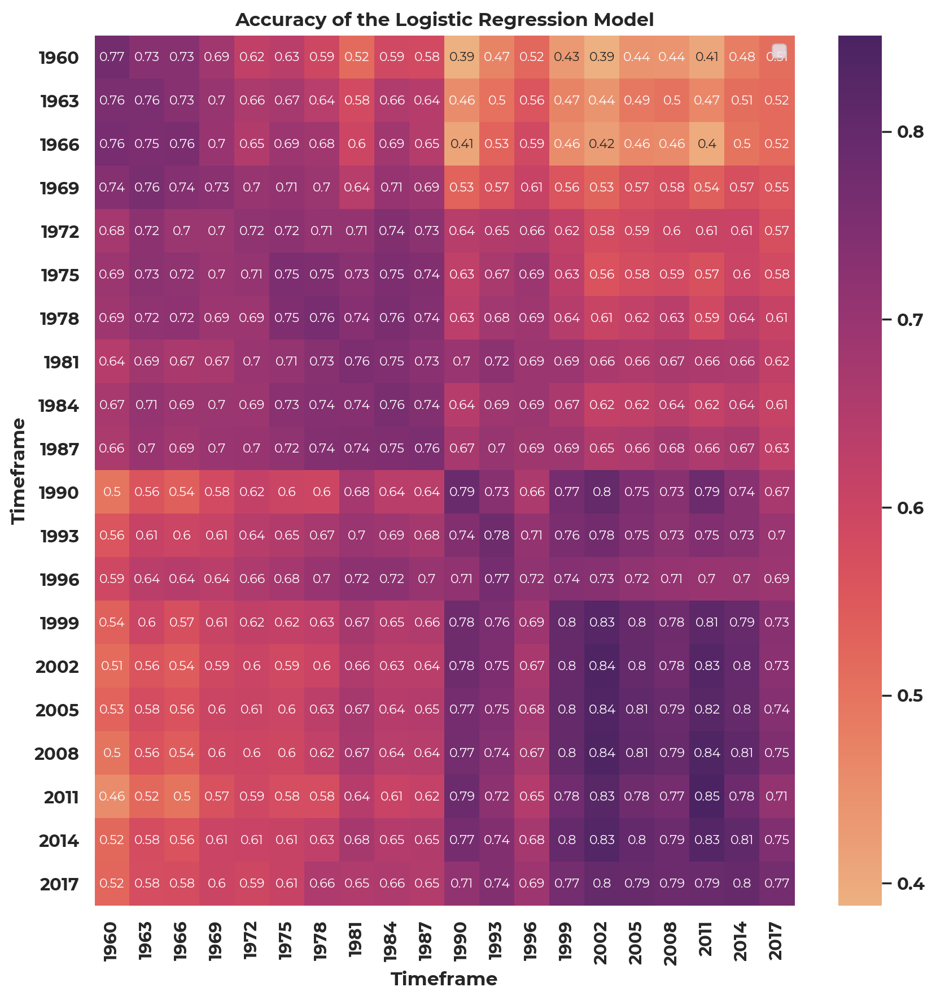

In [337]:
csfont = {'fontname':'Montserrat', 'fontweight':'bold'}
# make a correlation matrix plot with accuracy_matrix
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.heatmap(accuracy_matrix, annot=True, fmt=".2f", xticklabels=years, yticklabels=years, ax=ax, cmap="flare")

ax.set_title('Accuracy of the Logistic Regression Model', **csfont)
ax.set_xticklabels(ax.get_xticklabels(), **csfont)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, **csfont)
# change annotations font
for text in ax.texts:
    text.set_fontname("Montserrat")
    # round the number to 2 decimals
    text.set_text(round(float(text.get_text()), 2))
    if timeframe == 3:
        text.set_fontsize(8)
    else:
        text.set_fontsize(12)

plt.legend(prop={'family':'Montserrat'})
# change cmap ticks font
cbar = ax.collections[0].colorbar
cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(), **csfont)


ax.set_xlabel('Timeframe', **csfont)
ax.set_ylabel('Timeframe', **csfont)
plt.savefig(parent_dir + '/figures/accuracy_matrix' + str(timeframe) + '.png', dpi=200, bbox_inches='tight')
plt.show()



No handles with labels found to put in legend.
<ipython-input-384-04f603b91e6e>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(), **csfont)


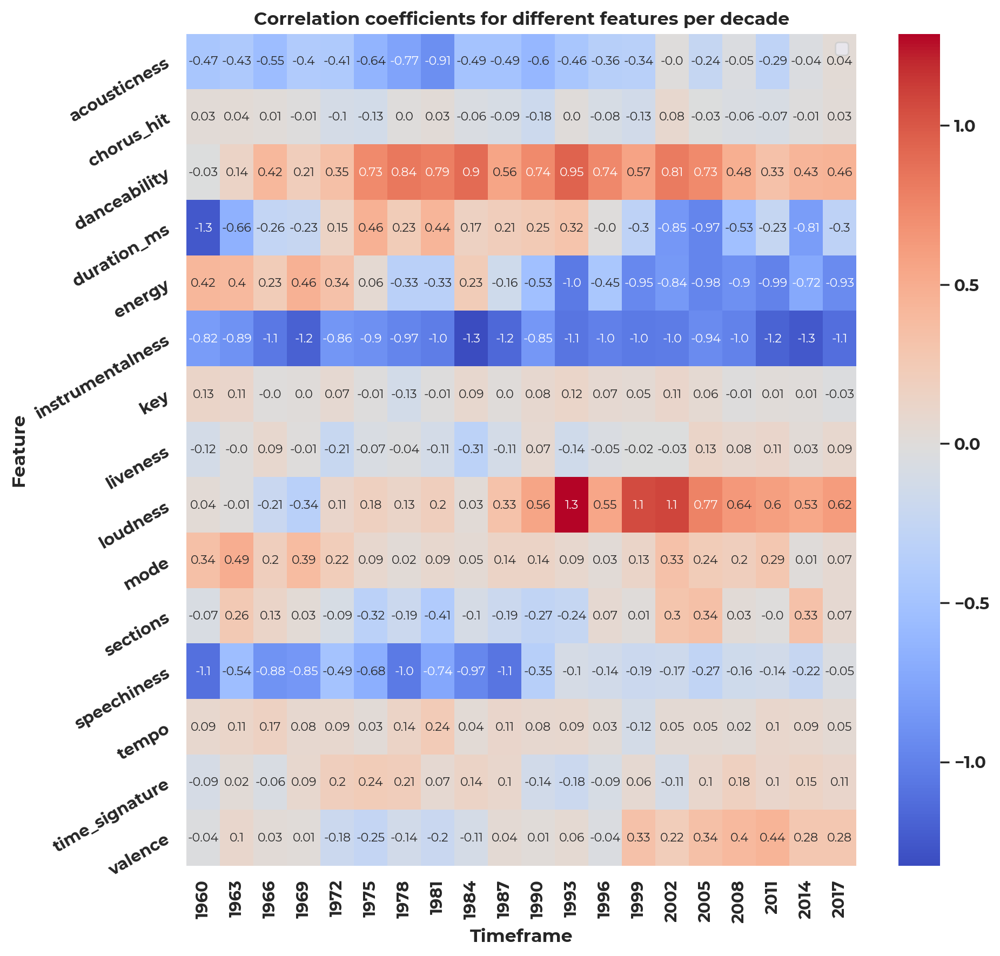

In [384]:
# Plot the correlation coefficients heatmap for all features, per decade

fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.heatmap(alphas.pivot(index='feature', columns='timeframe', values='alpha'), cmap="coolwarm", annot=True)

ax.set_title('Correlation coefficients for different features per decade', **csfont)
ax.set_xticklabels(ax.get_xticklabels(), **csfont)
ax.set_yticklabels(ax.get_yticklabels(), **csfont, rotation=30)
# change annotations font
for text in ax.texts:
    text.set_fontname("Montserrat")
    # round the number to 2 decimals
    text.set_text(round(float(text.get_text()), 2))
    if timeframe == 3:
        text.set_fontsize(8)
    else:
        text.set_fontsize(12)

plt.legend(prop={'family':'Montserrat'})
# change cmap ticks font
cbar = ax.collections[0].colorbar
cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(), **csfont)

ax.set_xlabel('Timeframe', **csfont)
ax.set_ylabel('Feature', **csfont)
plt.savefig(parent_dir + '/figures/correlation_coefficients' + str(timeframe) + '.png', dpi=200, bbox_inches='tight')
plt.show()

No handles with labels found to put in legend.


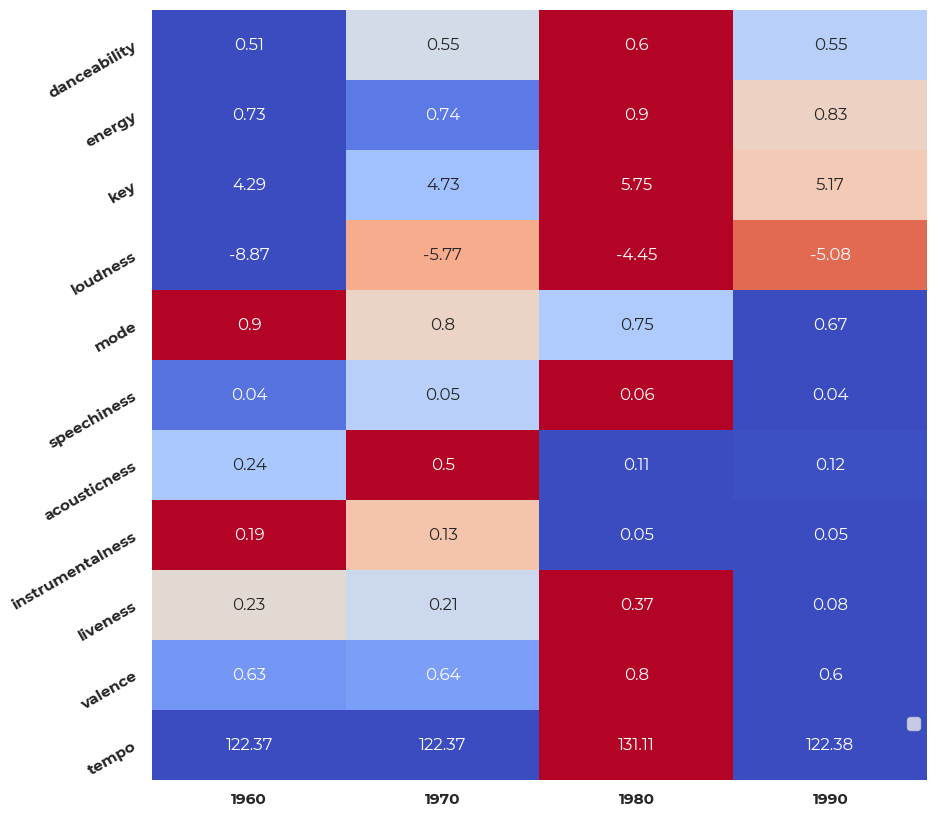

In [385]:
# get all songs where artist is madonna
madonna = df[df['artist'] == 'The Rolling Stones']
# get average of all features by decade
madonna = madonna.groupby(['decade']).mean()
# drop duration
madonna = madonna.drop(['duration_ms'], axis=1)
# drop target
madonna = madonna.drop(['target'], axis=1)

# normalise the data
# madonna = (madonna - madonna.mean()) / madonna.std()

# plot the features over time
# fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
# # transpose the dataframe
madonna = madonna.T


idx = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
f, axs = plt.subplots(len(idx), 1, gridspec_kw={'hspace': 0})
f.set_figheight(10)
f.set_figwidth(10)

counter = 0
for index, row in madonna.iterrows():
    try:
        sns.heatmap(np.array([row.values]), yticklabels=[idx[counter]], xticklabels=madonna.columns, annot=True, fmt='.2f', ax=axs[counter], cmap='coolwarm', cbar=False)
        counter += 1
    except:
        break
for ax in axs.flat:
    ax.set_xticklabels(ax.get_xticklabels(), **csfont)
    ax.set_yticklabels(ax.get_yticklabels(), **csfont, rotation=30)
    # change annotations font
    for text in ax.texts:
        text.set_fontname("Montserrat")
        # round the number to 2 decimals
        text.set_text(round(float(text.get_text()), 2))
        if timeframe == 3:
            text.set_fontsize(12)
        else:
            text.set_fontsize(12)

plt.legend(prop={'family':'Montserrat'})
plt.savefig(parent_dir + '/figures/madonna' + str(timeframe) + '.png', dpi=200, bbox_inches='tight')
plt.show()


<ipython-input-319-ea8c063baddf>:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), **csfont)
<ipython-input-319-ea8c063baddf>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(), **csfont, rotation=30)


IndexError: list index out of range

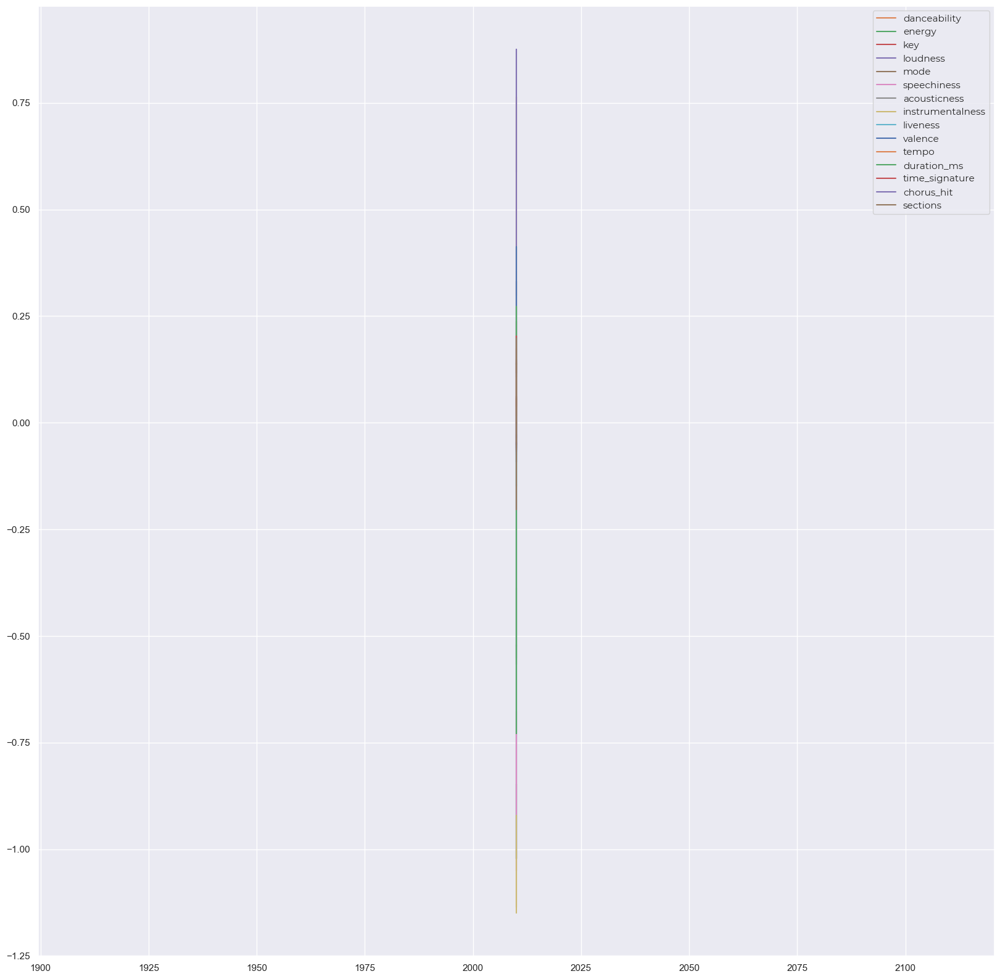

In [319]:
# Format the dataframe for the line plot
alphas_plot = pd.DataFrame(alphas_total, 
columns=[
        'danceability', 
        'energy', 
        'key', 
        'loudness', 
        'mode', 
        'speechiness', 
        'acousticness', 
        'instrumentalness', 
        'liveness', 
        'valence', 
        'tempo', 
        'duration_ms', 
        'time_signature', 
        'chorus_hit', 
        'sections', 
        'timeframe'
        ])
        
# Plot the correlation coefficients line plot for all features, per decade
plt.plot(alphas_plot['decade'], alphas_plot['energy'])

for col in alphas_plot.columns:
    if col != 'decade':
        plt.plot(alphas_plot['decade'], alphas_plot[col], label=col)
plt.legend()

ax.set_title('Correlation coefficients for different features per decade', **csfont)
ax.set_xticklabels(ax.get_xticklabels(), **csfont)
ax.set_yticklabels(ax.get_yticklabels(), **csfont, rotation=30)
# change annotations font
for text in ax.texts:
    text.set_fontname("Montserrat")

plt.legend(prop={'family':'Montserrat'})
# change cmap ticks font
cbar = ax.collections[0].colorbar
cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(), **csfont)

ax.set_xlabel('Decade', **csfont)

plt.show()

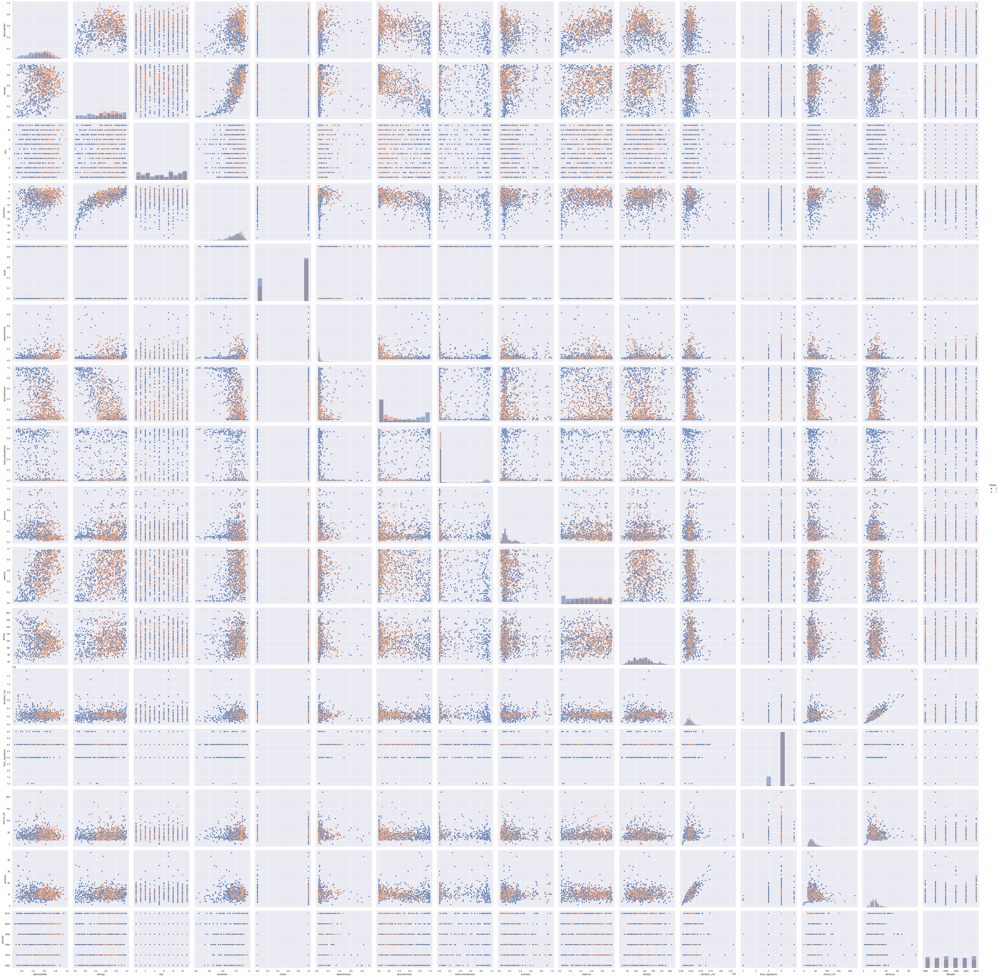

In [624]:
# df2 equal to 150 tracks from each decade
df2 = pd.DataFrame(columns=df.columns)
decades = [1960, 1970, 1980, 1990, 2000, 2010]
for decade in decades:
    df2 = df2.append(df[df['decade'] == decade].sample(n=150))

g = sns.PairGrid(df2, hue='target', height=4)
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

# save figure as pairgrid.png
plt.savefig(parent_dir + '/figures/pairgrid.png', dpi=200, bbox_inches='tight')
plt.show()

In [639]:
# Identify one features with the highest correlation coefficients for each decade
top_features_per_decade = alphas.groupby('timeframe').apply(lambda x: x.nlargest(2, 'alpha')).reset_index(drop=True)

# if feature is mode, drop it
top_features_per_decade = top_features_per_decade[top_features_per_decade['feature'] != 'mode']

# keep the first row for each decade
top_features_per_decade = top_features_per_decade.drop_duplicates(subset=['timeframe'])

print(top_features_per_decade)

         feature     alpha timeframe
1         energy  0.321755      1960
2   danceability  0.533394      1970
4   danceability  0.674021      1980
6   danceability  0.794102      1990
8       loudness  0.902340      2000
10      loudness  0.580175      2010


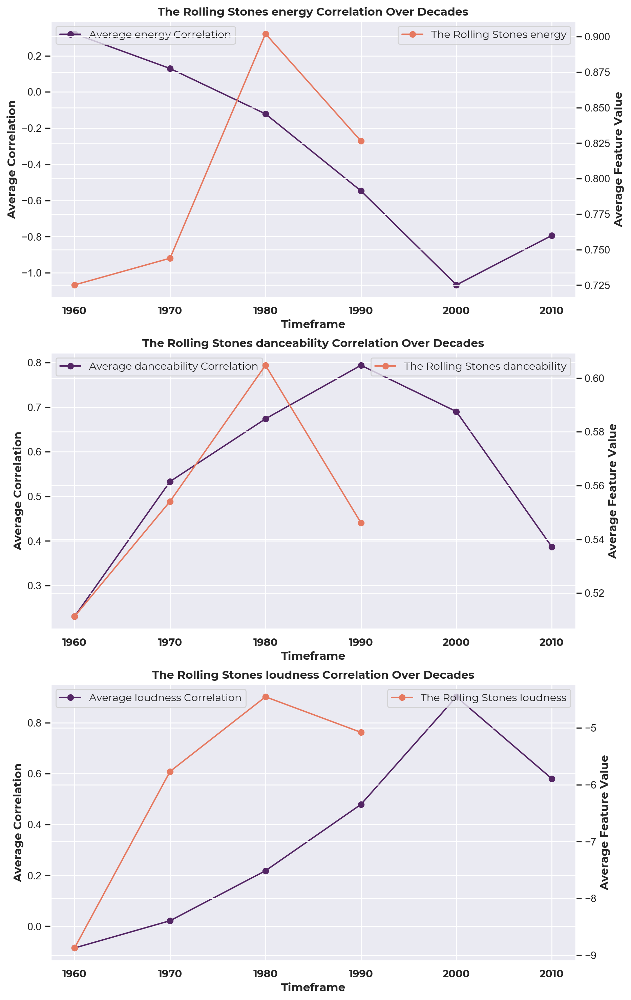

In [691]:
# Create a dict that maps each feature to a unique decade
feature_decade_dict = {}
for decade, feature in top_features_per_decade.groupby('timeframe')['feature']:
   feature_name = feature.iloc[0]
   if feature_name not in feature_decade_dict:
       feature_decade_dict[feature_name] = decade

# Create subplots for each unique feature
fig, axs = plt.subplots(len(feature_decade_dict), 1, figsize=(10, 6 * len(feature_decade_dict)), dpi=200)

# Plot the feature importance and Beatles' feature for each unique feature
for i, (feature_name, decade) in enumerate(feature_decade_dict.items()):
   artist_name = 'The Rolling Stones'
   # Get the corresponding Beatles' feature
   beatles_feature = df[(df['artist'] == artist_name) & (df[feature_name])].groupby('decade')[feature_name].mean()
   # get the average correlation coefficient for the feature over all decades
   avg_danceability_corr = alphas[alphas['feature'] == feature_name].groupby('timeframe')['alpha'].mean()
   # set x_values for the line plot
   x_values_avg_corr = avg_danceability_corr.index
   x_values_beatles = beatles_feature.index
   
   axs[i].plot(x_values_avg_corr, avg_danceability_corr.values, marker='o', label='Average ' + feature_name + ' Correlation', color='#542665')
   axs[i].yaxis.set_label_position("left")
   axs[i].set_ylabel('Correlation', **csfont)
   axs[i].set_ylabel('Average Correlation', **csfont)
   # plot on second y axis, because the values are on different scales
   ax2 = axs[i].twinx()
   
   ax2.plot(x_values_beatles, beatles_feature.values, marker='o', label=artist_name + ' ' + feature_name, color='#E67960')
   # add ax2 label to the legend of axs[i]
   ax2.legend(loc='upper right', prop={'family':'Montserrat'})
   # set ylabel on the right
   ax2.yaxis.set_label_position("right")
   ax2.set_ylabel('Average Feature Value', **csfont)
   
   axs[i].set_xticks(x_values_avg_corr)
   axs[i].set_xticklabels(x_values_avg_corr, **csfont)
   axs[i].set_xlabel('Timeframe', **csfont)
   axs[i].set_title(f'{artist_name} {feature_name} Correlation Over Decades', **csfont)
   axs[i].legend(loc='upper left', prop={'family':'Montserrat'})

   # change annotations font
   for text in axs[i].texts:
      text.set_fontname("Montserrat")
      # round the number to 2 decimals
      text.set_text(round(float(text.get_text()), 2))
      if timeframe == 3:
         text.set_fontsize(8)
      else:
         text.set_fontsize(12)

plt.show()


In [ ]:

# Create a logistic regression model for each decade and print out the accuracy scores
for decade in decades:
    print(decade)
    X_train, X_val, X_test, y_train, y_val = split_data(predictor_df, decade)
    model, n_scores_train, n_scores_val, alphas, alphas_plot = logreg(X_train, X_val, X_test, y_train, y_val, predictor_df, decade, alphas)
    alphas_total.append(alphas_plot)
    print('---------------------------------------------\n')

    # Create an explainer for the model
    explainer = shap.Explainer(model, X_train)

    # Compute SHAP values
    shap_values = explainer.shap_values(X_train)

    # Check the structure and type of your shap_values and X_train data
    print(type(shap_values), shap_values.shape)
    print(type(X_train), X_train.shape)

    # If shap_values is not a 2D array, reshape it
    if len(shap_values.shape) == 1:
        shap_values = shap_values.reshape(-1, 1)

    # Create a summary plot for the decade
    print(f"SHAP Summary Plot for {decade}")
    shap.summary_plot(shap_values, X_train) 


In [720]:
alphas

,feature,alpha,timeframe
0,danceability,0.269287,1960
1,energy,0.389122,1960
2,key,0.044907,1960
3,loudness,-0.103734,1960
4,mode,0.310900,1960
...,...,...,...
85,tempo,0.029282,2010
86,duration_ms,-0.342692,2010
87,time_signature,0.109351,2010
88,chorus_hit,-0.023352,2010


In [386]:
import pandas as pd
import os
import numpy as np
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import requests
import time

In [387]:
# log into spotify api using client credentials, and get metadata for a song using its uri
client_credentials_manager = SpotifyClientCredentials(client_id='00192ef409c4480c8ecad758c9ed8478', client_secret='f6a4d11d5187418a99b8045ec84fb3b6')
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

In [607]:
# use requests to log into spotify api using client credentials, and get release date for a song using its uri
def get_song_info(uri):
    # get song features

    url1 = 'https://api.spotify.com/v1/audio-analysis/' + uri.split(':')[2]
    url2 = 'https://api.spotify.com/v1/audio-features/' + uri.split(':')[2]
    url3 = 'https://api.spotify.com/v1/tracks/' + uri.split(':')[2]
    headers = {'Authorization': 'Bearer ' + client_credentials_manager.get_access_token(as_dict=False)}

    r = requests.get(url1, headers=headers)
    analysis = r.json()

    r = requests.get(url2, headers=headers)
    features = r.json()

    r = requests.get(url3, headers=headers)
    track = r.json()
    # get track artist
    artist = track['artists'][0]['name']
    # get track name and track release year
    track_name = track['name']
    release_date = track['album']['release_date']
    # get only year from release date
    release_date = release_date.split('-')[0]

    sections = pd.DataFrame(analysis['sections'])
    # get start of third section
    chorus_hit = sections.iloc[2]['start']
    sections_length = len(sections)

    df = pd.DataFrame(features, index=[0])
    # drop unnecessary columns
    df = df.drop(['type', 'uri', 'track_href', 'analysis_url', 'id'], axis=1)
    # add chorus hit and sections length
    df['chorus_hit'] = chorus_hit
    df['sections'] = sections_length

    return df, track_name, artist, release_date

In [614]:
df_song, track_name, artist, release_date = get_song_info('spotify:track:3G5c2rgIMpme50vWgx3UOk')

# round down year to nearest decade
release_date_round = int(release_date) - int(release_date) % 10

print(artist, ' - ', track_name, '(', release_date, ')')
# load scaler from scalers folder based on release date
if release_date_round == 2020:
    release_date_round = 2010
filename = parent_dir + '/scalers/sc_' + str(release_date_round) + '.bin'
scaler = pickle.load(open(filename, 'rb'))

df_song = pd.DataFrame(scaler.transform(df_song), index=df_song.index, columns=df_song.columns)

# predict if the song is a hit or not
def predict_song(r):
    # for every model in models folder
    lst = os.listdir(parent_dir + '/models')
    lst.sort()
    for filename in lst:
        # load the model
        model = pickle.load(open(parent_dir + '/models/' + filename, 'rb'))
        # predict if the song is a hit or not
        prediction = model.predict(r)
        if prediction[0] == 0:
            prediction = 'not a hit'
        else:
            prediction = 'hit'
        print(filename.split('_')[2][:-4] + ':', prediction)
predict_song(df_song)



LAUD  -  ОК ( 2023 )
1960: not a hit
1970: hit
1980: hit
1990: hit
2000: hit
2010: hit
